### **Area-based approach:**
- Get 2 images (RGB reference image red misaligned image) <br>
- Get the inverse of the given transform as initial transform <br>
- Apply the Nelder-Mead simplex method to get new transform

### **Dependencies:**

In [2]:
import cv2
import numpy as np
import pandas as pd
from PIL import Image
from scipy import optimize
from matplotlib import pyplot as plt
from IPython.display import clear_output
from skimage.measure import compare_ssim

import warnings
warnings.filterwarnings('ignore')

### **Read images from file through dataframe referencing:**

In [29]:
df = pd.read_pickle("master_manifest_train_red.pkl")
print('Number of train instances: {}'.format(len(df)),'\n')
df.drop('survey_id',axis=1,inplace=True)
print('The dataframe columns: {}'.format(df.keys()),'\n')
df.head()

Number of train instances: 103 

The dataframe columns: Index(['anchor_image_path', 'ref_image_path', 'target_image_path',
       'transform'],
      dtype='object') 



,anchor_image_path,ref_image_path,target_image_path,transform
0,survey_8502/target/aligned/red/tile__0.npy,survey_8502/reference/tile__0.npy,survey_8502/target/misaligned/red/tile__0.npy,"(0.9549864530563354, 0.0, 0.0, 0.0, 0.95338803..."
1,survey_8502/target/aligned/red/tile__1.npy,survey_8502/reference/tile__1.npy,survey_8502/target/misaligned/red/tile__1.npy,"(0.9549864530563354, 0.0, 0.0, 0.0, 0.95338803..."
2,survey_8502/target/aligned/red/tile__2.npy,survey_8502/reference/tile__2.npy,survey_8502/target/misaligned/red/tile__2.npy,"(0.9549864530563354, 0.0, 0.0, 0.0, 0.95338803..."
3,survey_8502/target/aligned/red/tile__3.npy,survey_8502/reference/tile__3.npy,survey_8502/target/misaligned/red/tile__3.npy,"(0.9549864530563354, 0.0, 0.0, 0.0, 0.95338803..."
4,survey_8502/target/aligned/red/tile__4.npy,survey_8502/reference/tile__4.npy,survey_8502/target/misaligned/red/tile__4.npy,"(0.9549864530563354, 0.0, 0.0, 0.0, 0.95338803..."


In [4]:
# Choose an instance:
i = 0

# Get misaligned image:
I = np.load(df.values[i][2])[0]
I = cv2.normalize(I, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
image_mis = I.astype(np.uint8)
rows,cols = image_mis.shape

# Get reference image (use the red channel):
I = np.load(df.values[i][1])[0][:,:,0]
I = cv2.normalize(I, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
im = Image.fromarray(I.astype(np.uint8))
image_ref = np.array(im.resize((cols,rows)))

#### **Melder-Mead simplex mimization algorithm:**

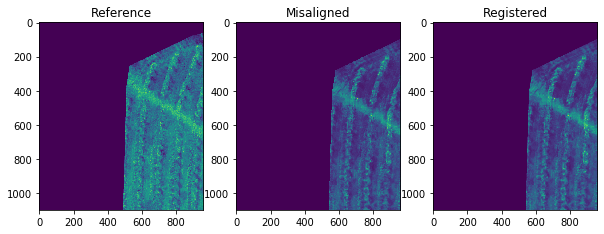

In [7]:
def f(M):
    global image_mis
    global image_ref
    rows,cols = image_mis.shape
    matrix = np.reshape(M, (-1, 3))
    reg_image = cv2.warpAffine(image_mis,matrix,(cols,rows))
    Rev_Corr = 1/np.corrcoef(reg_image.flat, image_ref.flat)[0,1]
    return Rev_Corr

# Perform initial transformation: 
M = np.reshape(df.values[i][3], (-1, 3))
M = np.append(M,[[0.,0.,1.]],axis=0)
M_inv = np.linalg.inv(M)
matrix = np.delete(M_inv,2,0)
reg_image = cv2.warpAffine(image_mis,matrix,(cols,rows))
Corr = 1/np.corrcoef(reg_image.flat, image_ref.flat)[0,1]

# Apply Nelder-Mead algorithm:
M = matrix.flatten()
M_corr = optimize.minimize(f,M,method='Nelder-Mead')

# Perform new transformation and calculate correlation coefficient:
New_matrix = np.reshape(M_corr.x, (-1, 3))
reg_image_new = cv2.warpAffine(image_mis,New_matrix,(cols,rows))
Corr_new = 1/np.corrcoef(reg_image_new.flat, image_ref.flat)[0,1]

# Plot registration:
plt.figure(figsize=(10,12))
plt.subplot(131)
plt.imshow(image_ref)
plt.title('Reference')
plt.subplot(132)
plt.imshow(image_mis)
plt.title('Misaligned')
plt.subplot(133)
plt.imshow(reg_image_new)
plt.title('Registered')
plt.show()

#### **Similarality measures before and after registration:**
Although visually the results are not satisfactory, let's look at the similarity measures: (structural similarity index and correlation coefficient) --> The reason of that choice is that these two metrics are relatively easy to compute, although a more appropriate one should be mutual information as the modalities of the two images are not exactly the same (red channel of an RGB image vs narrowband red image) --> This can be the object of a further investigation after the visual alignement issue is first resolved. <br>
- With SSIM --> Very minor improvement from 0.63122 to 0.63255.
- With Corr_Coef --> minor improvement from 0.77286 to 0.77525.

In [8]:
print('Transformation matrix:')
print(New_matrix,'\n')
(score, diff) = compare_ssim(image_mis, image_ref, full=True)
diff = (diff * 255).astype("uint8")
print('Compare reference with misaligned (with the Structural Similarity Index):')
print("SSIM: {}".format(score),'\n')
(score1, diff1) = compare_ssim(reg_image_new,image_ref, full=True)    
diff1 = (diff1 * 255).astype("uint8")
print('Compare reference with registered (with the Structural Similarity Index):')
print("SSIM: {}".format(score1))

Transformation matrix:
[[ 9.99468627e-01  1.36913069e-05  2.86685011e-04]
 [-3.36932513e-04  9.99840730e-01  3.72030641e-04]] 

Compare reference with misaligned (with the Structural Similarity Index):
SSIM: 0.6312214876375185 

Compare reference with registered (with the Structural Similarity Index):
SSIM: 0.6325567453692896


In [9]:
print('Transformation matrix:')
print(New_matrix,'\n')
Corr = np.corrcoef(image_mis.flat, image_ref.flat)[0,1]
print('Compare reference with misaligned (with correlation coefficient):')
print("Correlation coefficient: {}".format(Corr),'\n')
Corr1 = np.corrcoef(reg_image_new.flat,image_ref.flat)[0,1]
print('Compare reference with registered (with correlation coefficient):')
print("Correlation coefficient: {}".format(Corr1))

Transformation matrix:
[[ 9.99468627e-01  1.36913069e-05  2.86685011e-04]
 [-3.36932513e-04  9.99840730e-01  3.72030641e-04]] 

Compare reference with misaligned (with correlation coefficient):
Correlation coefficient: 0.7728654876578409 

Compare reference with registered (with correlation coefficient):
Correlation coefficient: 0.775248652332255


#### **Looping through all instances:**
Average SSIM --> improvement from 0.53699 to 0.55937 <br>
Average Correlation coefficient --> improvement from 0.59084 to 0.66736

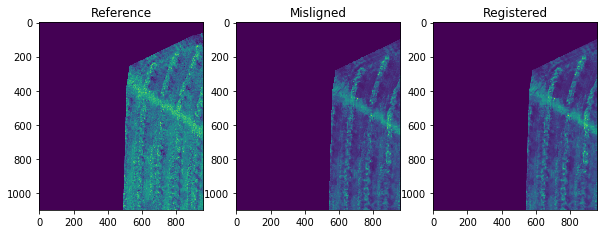

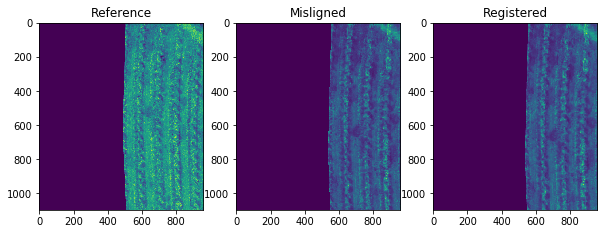

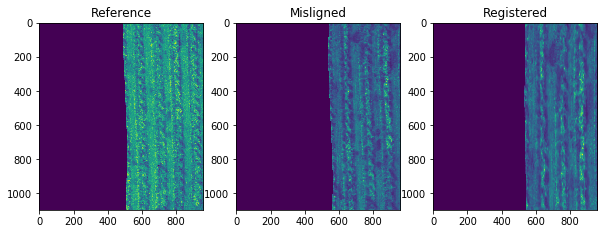

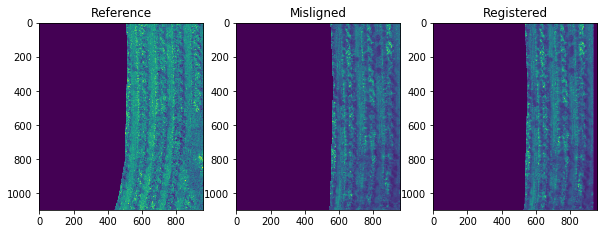

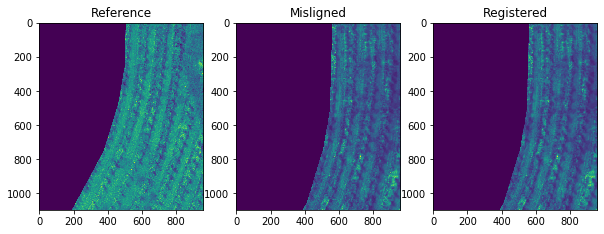

...

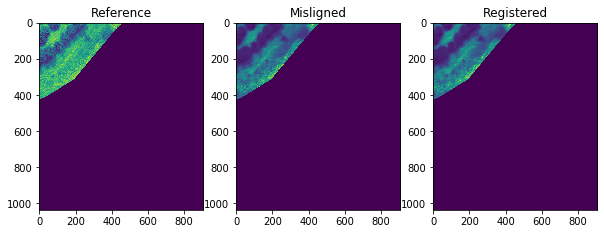

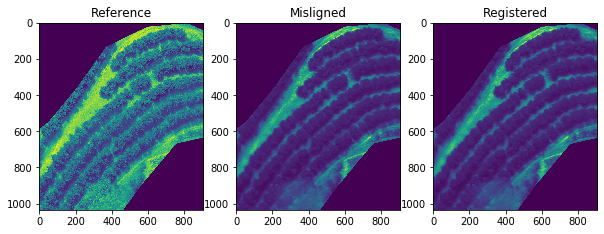

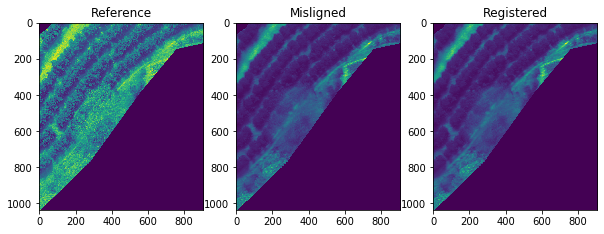

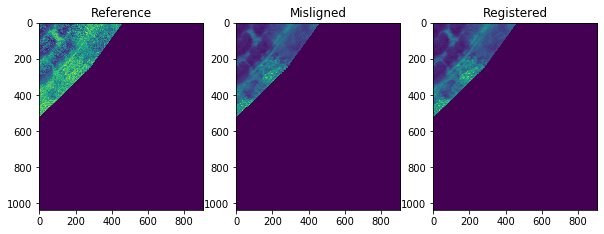

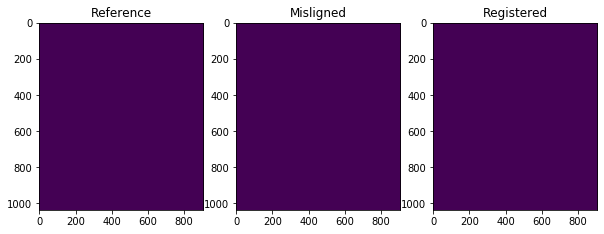

In [10]:
# Cost function for the Nelder-Mead minimizer:
def f(M):
    global image_mis
    global image_ref
    rows,cols = image_mis.shape
    matrix = np.reshape(M, (-1, 3))
    reg_image = cv2.warpAffine(image_mis,matrix,(cols,rows))
    Rev_Corr = 1/np.corrcoef(reg_image.flat, image_ref.flat)[0,1]
    return Rev_Corr

score = []
score1 = []
corr = []
corr1 = []
for i in range(len(df)):

    # Get misaligned image:
    I = np.load(df.values[i][2])[0]
    I = cv2.normalize(I, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
    image_mis = I.astype(np.uint8)
    rows,cols = image_mis.shape
    
    # Get reference image (use the red channel):
    I = np.load(df.values[i][1])[0][:,:,0]
    I = cv2.normalize(I, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
    im = Image.fromarray(I.astype(np.uint8))
    image_ref = np.array(im.resize((cols,rows)))
    
    # Perform initial transformation: 
    M = np.reshape(df.values[i][3], (-1, 3))
    M = np.append(M,[[0.,0.,1.]],axis=0)
    M_inv = np.linalg.inv(M)
    matrix = np.delete(M_inv,2,0)
    reg_image = cv2.warpAffine(image_mis,matrix,(cols,rows))
    Corr = 1/np.corrcoef(reg_image.flat, image_ref.flat)[0,1]

    # Apply Nelder-Mead algorithm:
    M = matrix.flatten()
    M_corr = optimize.minimize(f,M,method='Nelder-Mead')

    # Perform new transformation and calculate correlation coefficient:
    New_matrix = np.reshape(M_corr.x, (-1, 3))
    reg_image_new = cv2.warpAffine(image_mis,New_matrix,(cols,rows))
    Corr_new = 1/np.corrcoef(reg_image_new.flat, image_ref.flat)[0,1]

    # Compute SSIM:
    score.append(compare_ssim(image_mis, image_ref, full=True)[0].tolist())
    score1.append(compare_ssim(reg_image_new,image_ref, full=True)[0].tolist())
    
    # Compute Corr_Coef:
    corr.append(np.corrcoef(image_mis.flat, image_ref.flat)[0,1].tolist())
    corr1.append(np.corrcoef(reg_image_new.flat,image_ref.flat)[0,1].tolist())

    plt.figure(figsize=(10,12))
    plt.subplot(131), plt.imshow(image_ref), plt.title('Reference')
    plt.subplot(132), plt.imshow(image_mis), plt.title('Misligned')
    plt.subplot(133), plt.imshow(reg_image_new), plt.title('Registered')
    plt.show()

In [28]:
# Compute SSIM:
avg_score = np.mean(np.array([i for i in score if not np.isnan(i)]))
avg_score1 = np.mean(np.array([i for i in score1 if not np.isnan(i)]))
print('Average similarity of reference and misaligned:')
print("Correlation coefficient: {}".format(avg_score))
print('Compare reference with registered (with correlation coefficient):')
print("Correlation coefficient: {}".format(avg_score1),'\n')

# Compute Corr_Coef:
avg_corr = np.mean(np.array([i for i in corr if not np.isnan(i)]))
avg_corr1 = np.mean(np.array([i for i in corr1 if not np.isnan(i)]))
print('Compare reference with misaligned (with correlation coefficient):')
print("Correlation coefficient: {}".format(avg_corr))
print('Compare reference with registered (with correlation coefficient):')
print("Correlation coefficient: {}".format(avg_corr1))

Average similarity of reference and misaligned:
Correlation coefficient: 0.5369915240107777
Compare reference with registered (with correlation coefficient):
Correlation coefficient: 0.5593706183819417 

Compare reference with misaligned (with correlation coefficient):
Correlation coefficient: 0.5908411026162365
Compare reference with registered (with correlation coefficient):
Correlation coefficient: 0.6673669282904812
